In [20]:
#Load Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("u_car_data.csv").drop('Unnamed: 0', axis=1)
df.head()

,model,year,price,mileage,tax,mpg,engineSize,Diesel,Electric,Hybrid,...,Petrol,Automatic,Manual,Other.1,Semi-Auto,Audi,BMW,Hyundai,Mercedes,Toyota
0,GT86,2016,16000,24089,265,36.2,2.0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
1,GT86,2017,15995,18615,145,36.2,2.0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
2,GT86,2015,13998,27469,265,36.2,2.0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
3,GT86,2017,18998,14736,150,36.2,2.0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
4,GT86,2017,17498,36284,145,36.2,2.0,0,0,0,...,1,0,1,0,0,0,0,0,0,1


## Data Cleaning

In [4]:
df['model'] = df['model'].apply(lambda x:x.strip())

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46166 entries, 0 to 46165
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   model       46166 non-null  object 
 1   year        46166 non-null  int64  
 2   price       46166 non-null  int64  
 3   mileage     46166 non-null  int64  
 4   tax         46166 non-null  int64  
 5   mpg         46166 non-null  float64
 6   engineSize  46166 non-null  float64
 7   Diesel      46166 non-null  int64  
 8   Electric    46166 non-null  int64  
 9   Hybrid      46166 non-null  int64  
 10  Other       46166 non-null  int64  
 11  Petrol      46166 non-null  int64  
 12  Automatic   46166 non-null  int64  
 13  Manual      46166 non-null  int64  
 14  Other.1     46166 non-null  int64  
 15  Semi-Auto   46166 non-null  int64  
 16  Audi        46166 non-null  int64  
 17  BMW         46166 non-null  int64  
 18  Hyundai     46166 non-null  int64  
 19  Mercedes    46166 non-nul

In [6]:
df.isnull().sum()

model         0
year          0
price         0
mileage       0
tax           0
mpg           0
engineSize    0
Diesel        0
Electric      0
Hybrid        0
Other         0
Petrol        0
Automatic     0
Manual        0
Other.1       0
Semi-Auto     0
Audi          0
BMW           0
Hyundai       0
Mercedes      0
Toyota        0
dtype: int64

In [7]:
df1 = df.drop(columns=["Other", "Other.1"])

## EDA

In [43]:
# SellingPrice vs year vs mileage
import plotly.express as px
plt.figure(figsize=(40,40))
fig = px.scatter_3d(df1_Eda, x='year', y='mileage', z='price', color='model')
fig.show()

<Figure size 2880x2880 with 0 Axes>

In [78]:
# SellingPrice vs enginesize vs mpg
import plotly.express as px
plt.figure(figsize=(40,40))
fig = px.scatter_3d(df1_Eda, x='engineSize', y='mpg', z='price', color='model')
fig.show()

<Figure size 2880x2880 with 0 Axes>

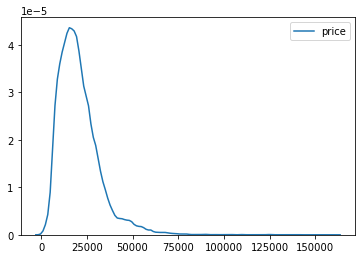

In [80]:
import seaborn as sns
# Distribution of car price
sns.kdeplot(df1['price'])

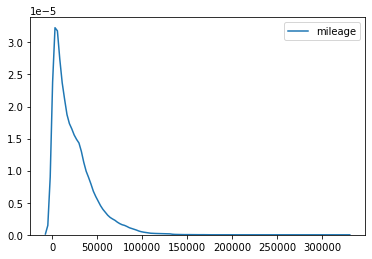

In [83]:
sns.kdeplot(df1['mileage'])

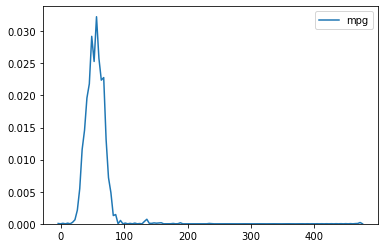

In [84]:
sns.kdeplot(df1['mpg'])

In [8]:
df2 = pd.get_dummies(df1,columns=['model'],  prefix='', prefix_sep='')
df2.head()

,year,price,mileage,tax,mpg,engineSize,Diesel,Electric,Hybrid,Petrol,...,X3,X4,X5,X6,X7,Yaris,Z3,Z4,i3,i8
0,2016,16000,24089,265,36.2,2.0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,2017,15995,18615,145,36.2,2.0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,2015,13998,27469,265,36.2,2.0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,2017,18998,14736,150,36.2,2.0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,2017,17498,36284,145,36.2,2.0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


# Modelling

In [9]:
X = df2.drop(['price'],axis='columns')
y = df2.price

In [10]:
X.head()

,year,mileage,tax,mpg,engineSize,Diesel,Electric,Hybrid,Petrol,Automatic,...,X3,X4,X5,X6,X7,Yaris,Z3,Z4,i3,i8
0,2016,24089,265,36.2,2.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,2017,18615,145,36.2,2.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,2015,27469,265,36.2,2.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,2017,14736,150,36.2,2.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,2017,36284,145,36.2,2.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)

In [12]:
from sklearn.linear_model import LinearRegression
lr_clf = LinearRegression()
lr_clf.fit(X_train,y_train)
lr_clf.score(X_test,y_test)

0.8475475526240177

In [13]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

cross_val_score(LinearRegression(), X, y, cv=cv)

array([0.83621829, 0.85622695, 0.86327199, 0.84771049, 0.84688614])

In [36]:
from sklearn.ensemble import RandomForestRegressor
rr = RandomForestRegressor(max_features='sqrt', random_state=0)
rr.fit(X_train,y_train)
rr.score(X_test,y_test)

0.9560396527200989

In [105]:
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor

def find_best_model_using_gridsearchcv(X,y):
    algos = {
        'linear_regression' : {
            'model': LinearRegression(),
            'params': {
                'normalize': [True, False]
            }
        },
        'lasso': {
            'model': Lasso(max_iter=5000),
            'params': {
                'alpha': [1,2],
                'selection': ['random', 'cyclic']
            }
        },
        'decision_tree': {
            'model': DecisionTreeRegressor(),
            'params': {
                'criterion' : ['mse','friedman_mse'],
                'splitter': ['best','random']
            }
        }
    }
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])

find_best_model_using_gridsearchcv(X,y)

,model,best_score,best_params
0,linear_regression,0.850063,{'normalize': False}
1,lasso,0.849188,"{'alpha': 1, 'selection': 'random'}"
2,decision_tree,0.934752,"{'criterion': 'mse', 'splitter': 'best'}"


In [37]:
def predict_price(brand, model, year, mileage, tax, mpg, engineSize, fuel_type, transmission_type):    
    model_index = np.where(X.columns==model)[0][0]
    brand_index = np.where(X.columns==brand)[0][0]
    fuel_type_index = np.where(X.columns==fuel_type)[0][0]
    transmission_type_index = np.where(X.columns==transmission_type)[0][0]

    
    x = np.zeros(len(X.columns))
    x[0] = year
    x[1] = mileage
    x[2] = tax
    x[3] = mpg
    x[4] = engineSize
    if brand_index >= 0:
        x[brand_index] = 1
    if model_index >= 0:
        x[model_index] = 1
    if fuel_type_index >= 0:
        x[fuel_type_index] = 1
    if transmission_type_index >= 0:
        x[transmission_type_index] = 1
    return rr.predict([x])[0]

In [41]:
predict_price("Toyota", "GT86", 2017, 36284,145, 36.2, 2.0, "Petrol", "Manual")

17464.32